# Test the hologram performances with HD111980 data 30 may 2017
==================================================================================================

- author : Sylvie
- creation date   : October 25 th2017
- update : October 27th 2017
- Version : 1.0


The goal of this notebook is to study the background to understand the accurracy of the measurement



#### problem because limitation in output of data

- firt I tried to generate a config file for jupyter

If you ran jupyter notebook --generate-config to create it, it should be in the correct place already. If not, try putting it at ~/.jupyter/jupyter_notebook_config.py

- and I set : 
> c.NotebookApp.iopub_data_rate_limit = 1000000

but it failed again so I launch jupyter as follow:

> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 Ana2DShapeSpectra.ipynb

So it behaves better

In [3]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Ana2DBackground
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_31may17/HD111980_2


In [5]:
from astropy.modeling import models, fitting

In [6]:
import pandas as pd

# Flags

In [7]:
ShowAllImageFlag=False
ShowAllImageFirstOrderFlag=False
ShowAllImageZeroOrderFlag=False

# Input directory

In [8]:
#inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_05jun17/"
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=74
MAX_IMGNUMBER=108
date="20170531"
object_name='HD111980'
tag = "rotimg"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

# Output directory

In [9]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

#outputdir="./spectrum_fitsspec"
#ensure_dir(outputdir)

# Open files
===================================

## order 0 position in original image

In [10]:
df=pd.read_csv('xy_pointing.csv')
x_star=df["x_pointing"]
y_star=df["y_pointing"]
all_theta=df["theta"]
x_pointing=x_star
y_pointing=y_star

In [11]:
order0_positions = np.array([x_pointing,y_pointing]).T

In [12]:
df.head()

,Unnamed: 0,theta,x_pointing,y_pointing
0,0,-0.573138,828.229602,563.336487
1,1,-0.795625,827.376519,565.081796
2,2,-0.966543,826.379751,564.157762
3,3,-1.929010,825.513989,563.989613
4,4,-1.632155,822.342548,564.266414


## order 0 position in rotated and cut image

In [13]:
df2=pd.read_csv('x_y_guess2.csv')
x_star2=df2["x_guess2"]
y_star2=df2["y_guess2"]
order0_positions2 = np.array([x_star2,y_star2]).T

In [14]:
df2.head()

,Unnamed: 0,theta,x_guess2,y_guess2
0,0,-0.573138,830.240529,208.377300
1,1,-0.795625,829.882747,211.358899
2,2,-0.966543,829.428848,213.846280
3,3,-1.929010,831.636281,228.853959
4,4,-1.632155,827.909538,223.541250


## Input image files

- rotated and cut images

In [15]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)
print all_images[0].shape

Number of images: 35
(400, 2048)


In [16]:
print all_filt

['RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg', 'RG715 Ron400', 'RG715 Thor300', 'RG715 HoloPhP', 'RG715 HoloPhAg', 'RG715 HoloAmAg']


## Check calib info on holograms and disperser

In [17]:
all_grat = []
all_holo = []
for f in all_filt :
    #all_grat.append(f.replace('RG715 ',''))
    all_grat.append(f.replace('dia ',''))
for index,g in enumerate(all_grat):
    holo = Hologram(g,verbose=False)
    #all_holo.append[holo]
    print 'holo_name=',g,'holo_theta=',holo.theta(order0_positions[index]),' rot_theta',all_theta[index],'order0_positions', order0_positions[index]

holo_name= RG715 Ron400 holo_theta= 0  rot_theta -0.573138423044 order0_positions [ 828.2296019   563.33648666]
holo_name= RG715 Thor300 holo_theta= 0  rot_theta -0.795625199068 order0_positions [ 827.37651939  565.08179603]
holo_name= RG715 HoloPhP holo_theta= 0  rot_theta -0.966543162278 order0_positions [ 826.3797509   564.15776171]
holo_name= RG715 HoloPhAg holo_theta= 0  rot_theta -1.92901044101 order0_positions [ 825.51398935  563.98961262]
holo_name= RG715 HoloAmAg holo_theta= 0  rot_theta -1.63215536597 order0_positions [ 822.34254767  564.26641391]
holo_name= RG715 Ron400 holo_theta= 0  rot_theta -0.608849241731 order0_positions [ 821.1201886   564.93611017]
holo_name= RG715 Thor300 holo_theta= 0  rot_theta -0.738075536667 order0_positions [ 820.92763826  566.35454391]
holo_name= RG715 HoloPhP holo_theta= 0  rot_theta -0.923359262749 order0_positions [ 820.20872466  565.55464023]
holo_name= RG715 HoloPhAg holo_theta= 0  rot_theta -1.92421510903 order0_positions [ 819.9063196  

## Show filters and dispersers

In [18]:
Filt_names

['dia Ron400',
 'dia Thor300',
 'dia HoloPhP',
 'dia HoloPhAg',
 'dia HoloAmAg',
 'dia Ron200',
 'Unknown']

In [19]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [20]:
print  Filt_names[0],' \t : filt0_idx :: ',filt0_idx
print  Filt_names[1],' \t : filt1_idx :: ',filt1_idx
print  Filt_names[2],' \t : filt2_idx :: ',filt2_idx
print  Filt_names[3],' \t : filt3_idx :: ',filt3_idx
print  Filt_names[4],' \t : filt4_idx :: ',filt4_idx
print  Filt_names[5],' \t : filt5_idx :: ',filt5_idx
print  Filt_names[6],' \t : filt6_idx :: ',filt6_idx

dia Ron400  	 : filt0_idx ::  [ 0  5 10 15 20 25 30]
dia Thor300  	 : filt1_idx ::  [ 1  6 11 16 21 26 31]
dia HoloPhP  	 : filt2_idx ::  [ 2  7 12 17 22 27 32]
dia HoloPhAg  	 : filt3_idx ::  [ 3  8 13 18 23 28 33]
dia HoloAmAg  	 : filt4_idx ::  [ 4  9 14 19 24 29 34]
dia Ron200  	 : filt5_idx ::  []
Unknown  	 : filt6_idx ::  []


In [21]:
print Filt_names[0],filt0_idx
print Filt_names[1],filt1_idx
print Filt_names[2],filt2_idx
print Filt_names[3],filt3_idx
print Filt_names[4],filt4_idx
print Filt_names[5],filt5_idx
print Filt_names[6],filt6_idx

dia Ron400 [ 0  5 10 15 20 25 30]
dia Thor300 [ 1  6 11 16 21 26 31]
dia HoloPhP [ 2  7 12 17 22 27 32]
dia HoloPhAg [ 3  8 13 18 23 28 33]
dia HoloAmAg [ 4  9 14 19 24 29 34]
dia Ron200 []
Unknown []


# Input images


Notice, we expect the spectrum is centered in vertical.
The central star is at the origin in the raw image

## Full rotated image

In [22]:
if ShowAllImageFlag:
    ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=100)

## Center of central star

Obviously the previous estimation of the center is wrong

In [23]:
# Center : Order 0
#-------------------
# start at star
y_star0=[all_images[0].shape[0]/2]*len(all_images)
x_star0=x_star2

if ShowAllImageZeroOrderFlag:

    #ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
    #                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
    ShowCenterImages(x_star0,y_star0,[100]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)

    title='Order 0 of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'order0.pdf')
    plt.savefig(figfilename)  

### check weighted_avg_and_std is a good estimator of the central position

/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


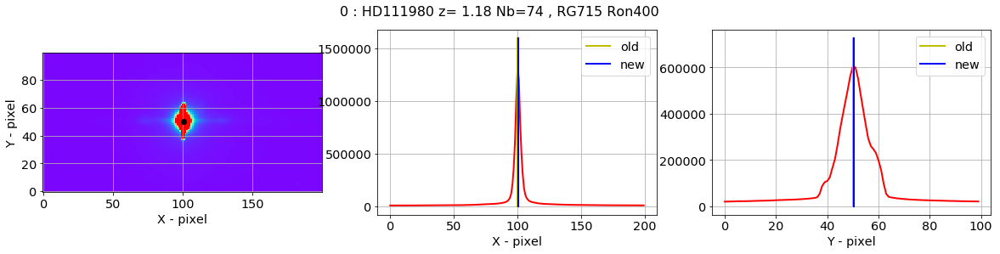

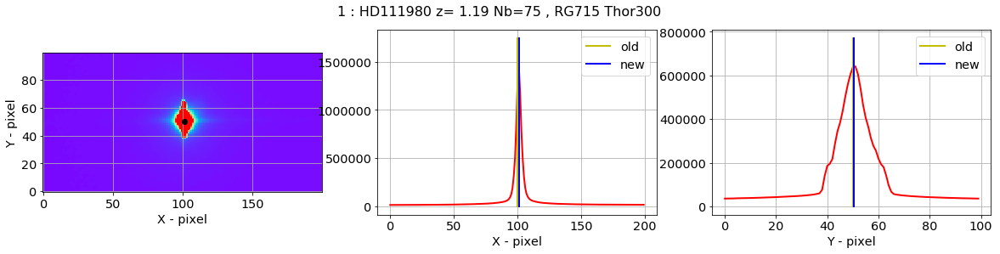

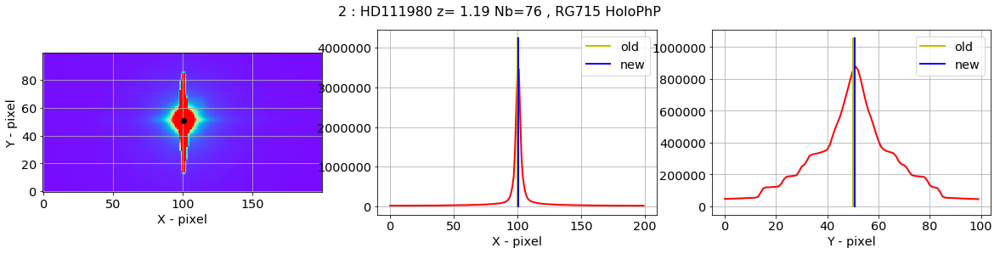

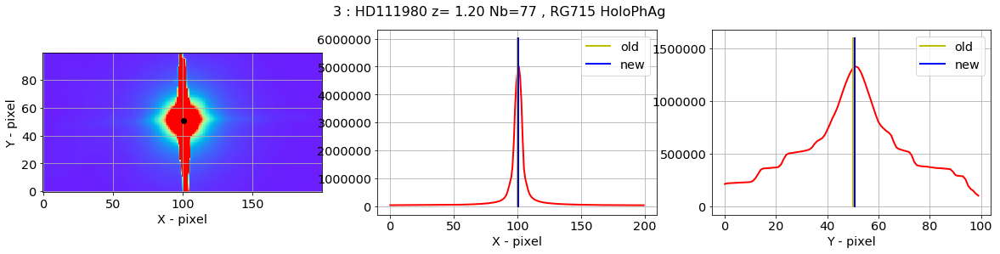

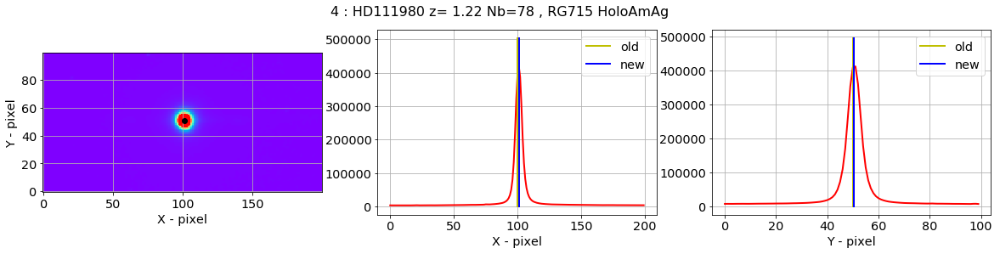

...

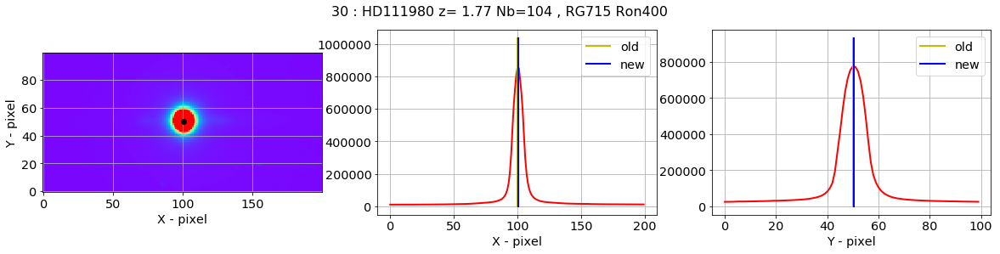

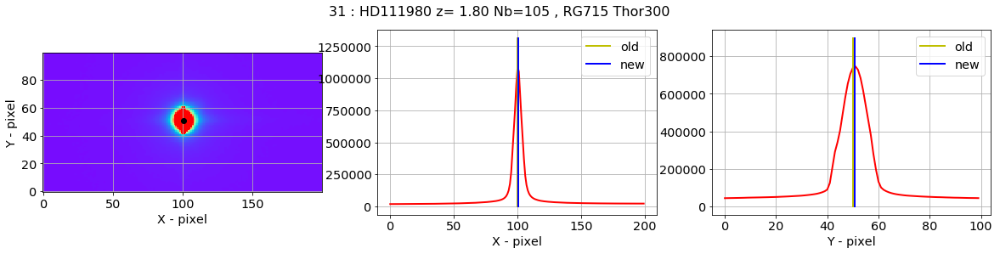

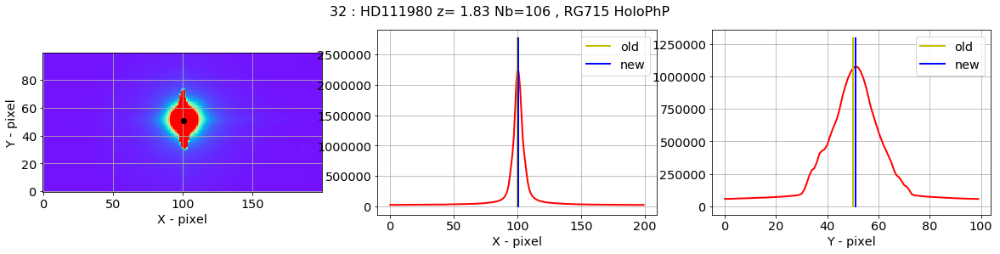

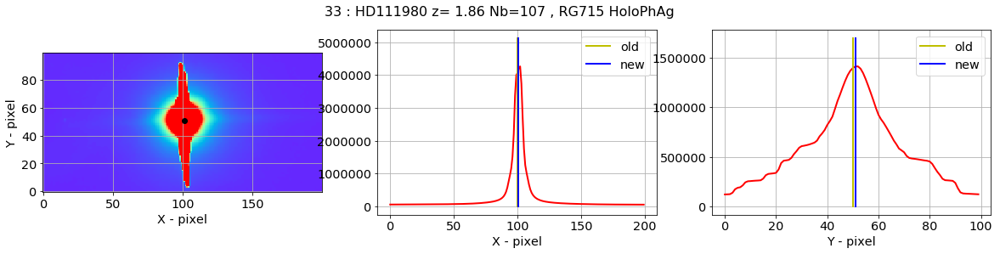

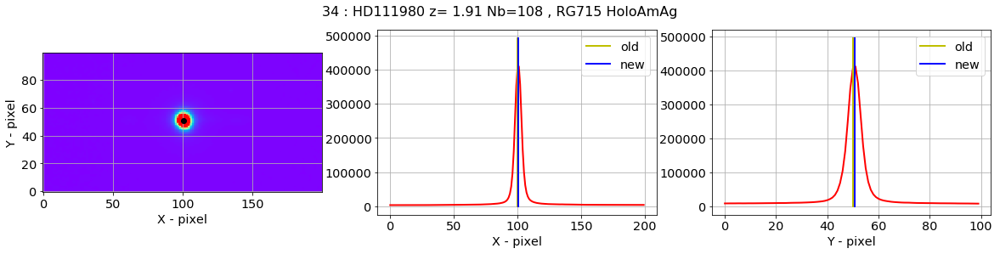

In [24]:
new_x_star,new_y_star=check_central_star(all_images,x_star2,y_star0,all_titles,all_filt)

## Zoom on the rotated image

In [25]:
# Right spectrum
#---------------
# start at star
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star

y_star0=new_y_star
x_star0=new_x_star

if ShowAllImageFirstOrderFlag:
    #ShowCenterImages([1300]*len(all_images),y_star0,[500]*len(all_images),[25]*len(all_images),
    #                all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
    ShowCenterImages(x_star0+400,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=200,target_pos=np.array([new_x_star,new_y_star]).T)

    title='Right part of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'rightorder.pdf')
    plt.savefig(figfilename)  

In [26]:
# Left spectrum
#--------------
#y_star0=[all_images[0].shape[0]/2]*len(all_images)
#x_star0=x_star-600

y_star0=new_y_star
x_star0=new_x_star

if ShowAllImageFirstOrderFlag:
    #ShowCenterImages([110]*len(all_images),[60]*len(all_images),[500]*len(all_images),[30]*len(all_images),
    #                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
    ShowCenterImages(x_star0-600,y_star0,[600]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,target_pos=np.array([new_x_star,new_y_star]).T)
    title='Left part of spectrum of {} '.format(object_name)
    plt.suptitle(title,size=16)
    figfilename=os.path.join(dir_top_images,'leftorder.pdf')
    plt.savefig(figfilename)  

# Plot one contour

Load hologram Ron400:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.3 degrees
Hologram center at x0 = 741.0 and y0 = 741.0 with average tilt of -0.3 degrees
Order  0 position at x0 = 435.0 and y0 = 742.5
Order +1 position at x0 = 1047.0 and y0 = 739.5
Distance between the orders: 611.97 pixels (14.69 mm)


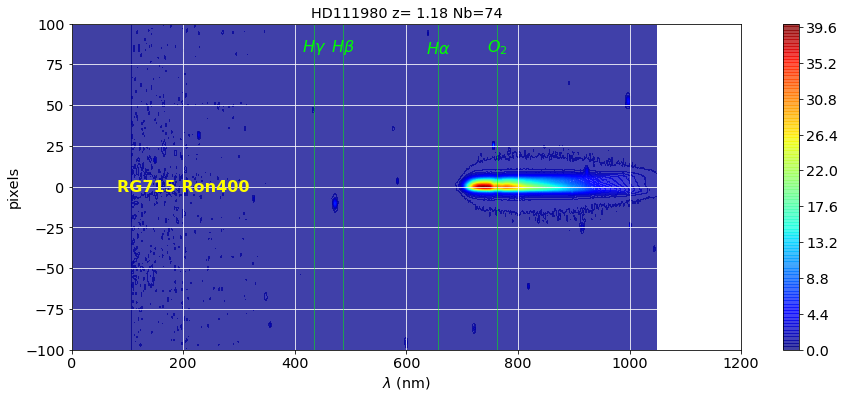

In [27]:
sel=0
ShowOneContourBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram Ron400:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.3 degrees
Hologram center at x0 = 741.0 and y0 = 741.0 with average tilt of -0.3 degrees
Order  0 position at x0 = 435.0 and y0 = 742.5
Order +1 position at x0 = 1047.0 and y0 = 739.5
Distance between the orders: 611.97 pixels (14.69 mm)


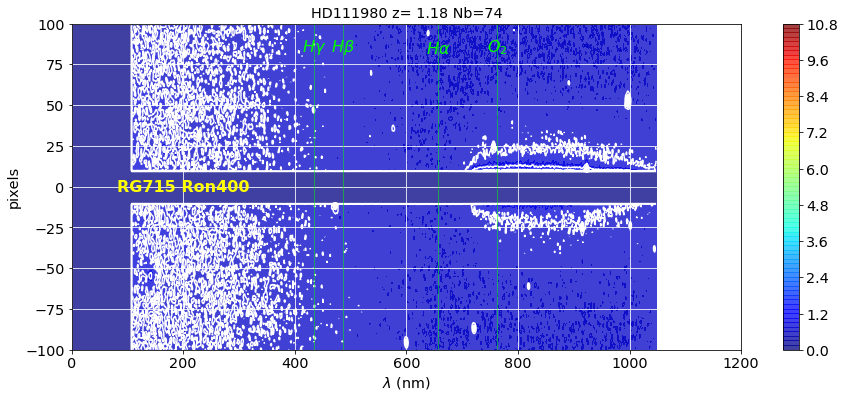

In [28]:
sel=0
ShowOneContourCutBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram Thor300:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.6 degrees
Hologram center at x0 = 1398.0 and y0 = 1264.0 with average tilt of -0.6 degrees
Order  0 position at x0 = 1172.7 and y0 = 1266.3
Order +1 position at x0 = 1623.3 and y0 = 1261.7
Distance between the orders: 450.55 pixels (10.81 mm)


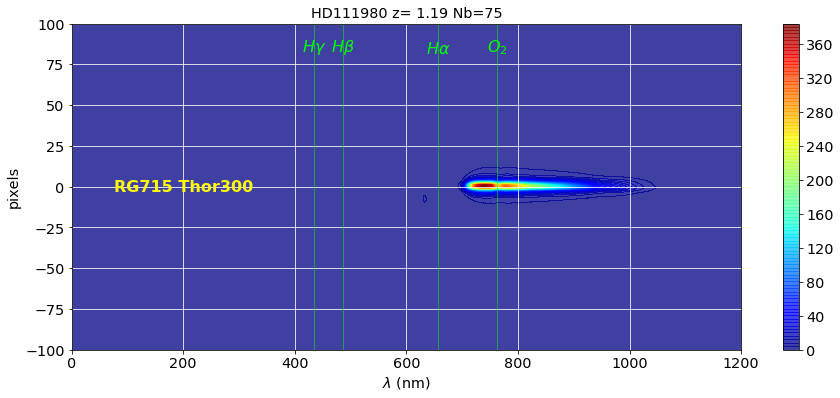

In [29]:
sel=1
ShowOneContourBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram Thor300:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.6 degrees
Hologram center at x0 = 1398.0 and y0 = 1264.0 with average tilt of -0.6 degrees
Order  0 position at x0 = 1172.7 and y0 = 1266.3
Order +1 position at x0 = 1623.3 and y0 = 1261.7
Distance between the orders: 450.55 pixels (10.81 mm)


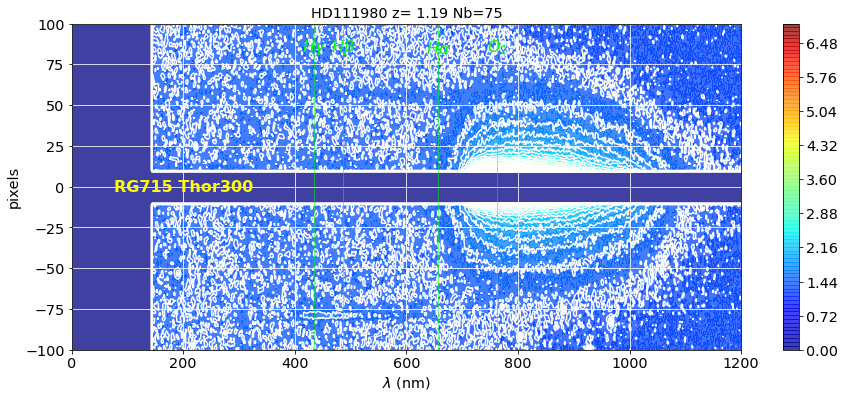

In [30]:
sel=1
ShowOneContourCutBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.0 degrees
Hologram center at x0 = 856.0 and y0 = 562.3 with average tilt of -1.0 degrees
Order  0 position at x0 = 590.7 and y0 = 567.2
Order +1 position at x0 = 1121.3 and y0 = 557.5
Distance between the orders: 530.76 pixels (12.74 mm)


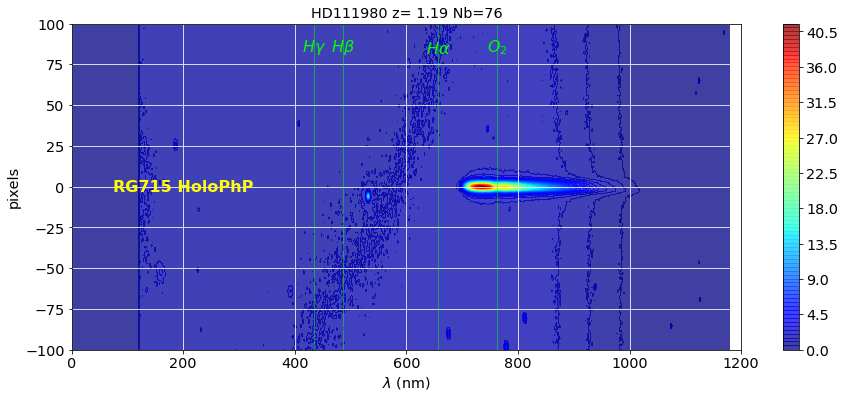

In [31]:
sel=2
ShowOneContourBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram HoloPhP:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.0 degrees
Hologram center at x0 = 856.0 and y0 = 562.3 with average tilt of -1.0 degrees
Order  0 position at x0 = 590.7 and y0 = 567.2
Order +1 position at x0 = 1121.3 and y0 = 557.5
Distance between the orders: 530.76 pixels (12.74 mm)


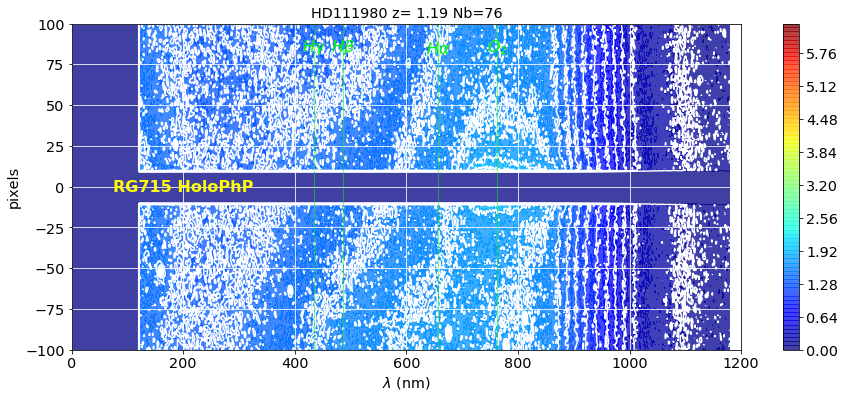

In [32]:
sel=2
ShowOneContourCutBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.9 degrees
Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)


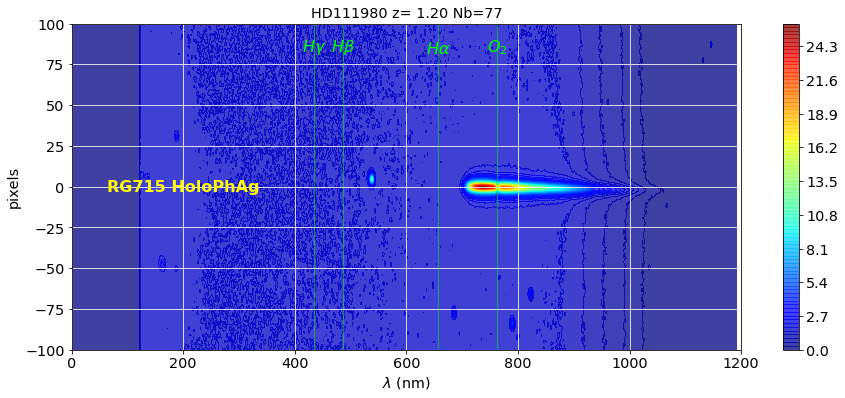

In [33]:
sel=3
ShowOneContourBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram HoloPhAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1044.2 and y0 = 606.7 with average tilt of -1.9 degrees
Order  0 position at x0 = 779.6 and y0 = 614.7
Order +1 position at x0 = 1308.7 and y0 = 598.7
Distance between the orders: 529.36 pixels (12.70 mm)


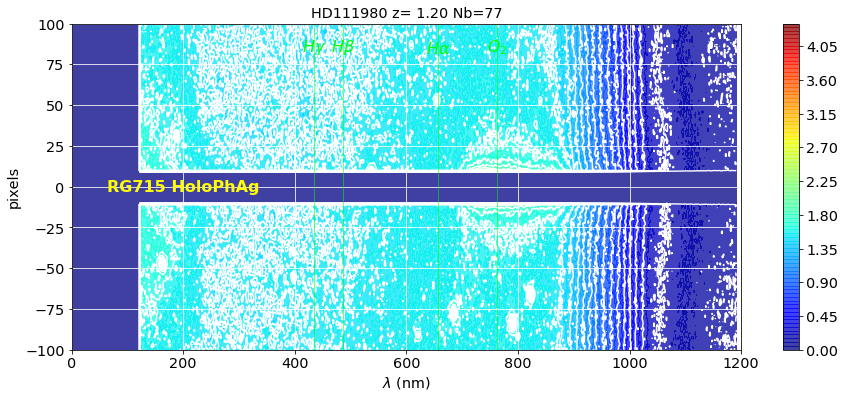

In [34]:
sel=3
ShowOneContourCutBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram Ron400:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.3 degrees
Hologram center at x0 = 741.0 and y0 = 741.0 with average tilt of -0.3 degrees
Order  0 position at x0 = 435.0 and y0 = 742.5
Order +1 position at x0 = 1047.0 and y0 = 739.5
Distance between the orders: 611.97 pixels (14.69 mm)


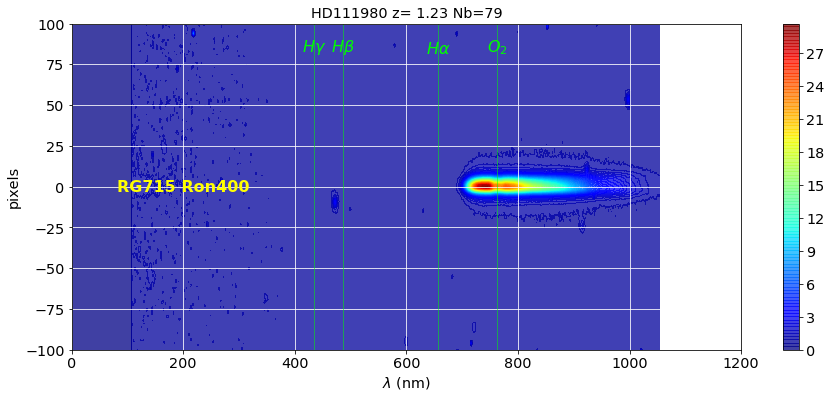

In [35]:
sel=5
ShowOneContourBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram Ron400:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.3 degrees
Hologram center at x0 = 741.0 and y0 = 741.0 with average tilt of -0.3 degrees
Order  0 position at x0 = 435.0 and y0 = 742.5
Order +1 position at x0 = 1047.0 and y0 = 739.5
Distance between the orders: 611.97 pixels (14.69 mm)


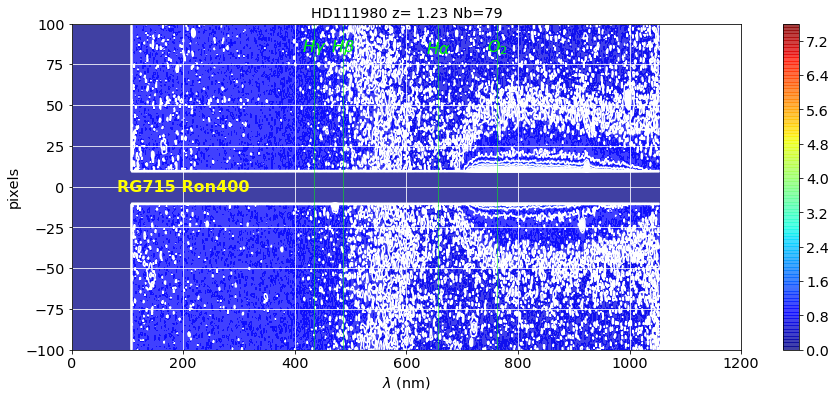

In [36]:
sel=5
ShowOneContourCutBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram Thor300:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.6 degrees
Hologram center at x0 = 1398.0 and y0 = 1264.0 with average tilt of -0.6 degrees
Order  0 position at x0 = 1172.7 and y0 = 1266.3
Order +1 position at x0 = 1623.3 and y0 = 1261.7
Distance between the orders: 450.55 pixels (10.81 mm)


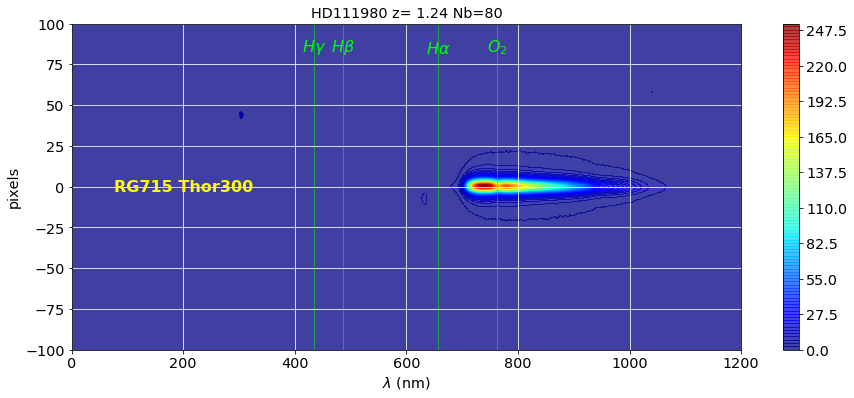

In [37]:
sel=6
ShowOneContourBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

Load hologram Thor300:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -0.6 degrees
Hologram center at x0 = 1398.0 and y0 = 1264.0 with average tilt of -0.6 degrees
Order  0 position at x0 = 1172.7 and y0 = 1266.3
Order +1 position at x0 = 1623.3 and y0 = 1261.7
Distance between the orders: 450.55 pixels (10.81 mm)


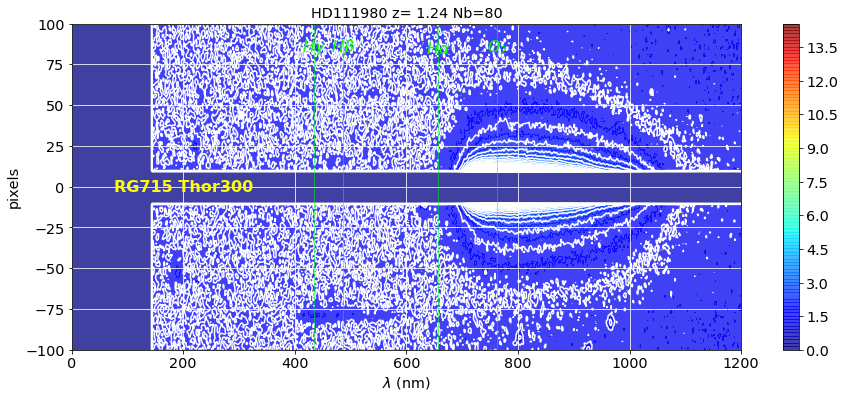

In [38]:
sel=6
ShowOneContourCutBKG(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

pdf Page written  1


/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


pdf Page written  2
pdf Page written  3
Final pdf Page written  3


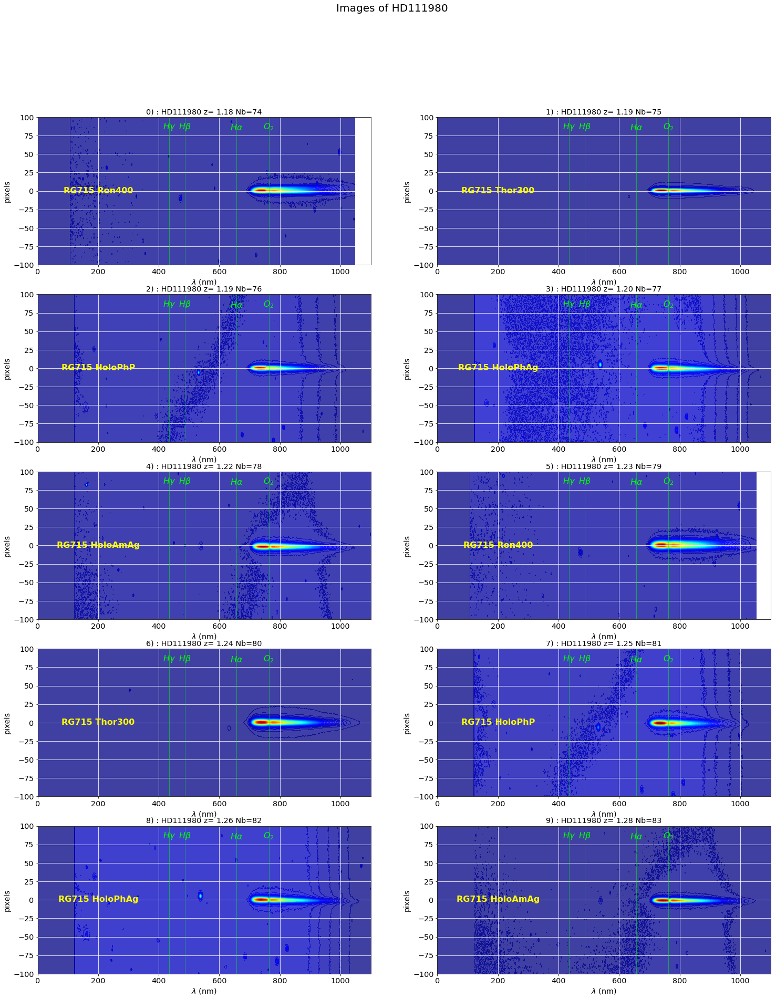

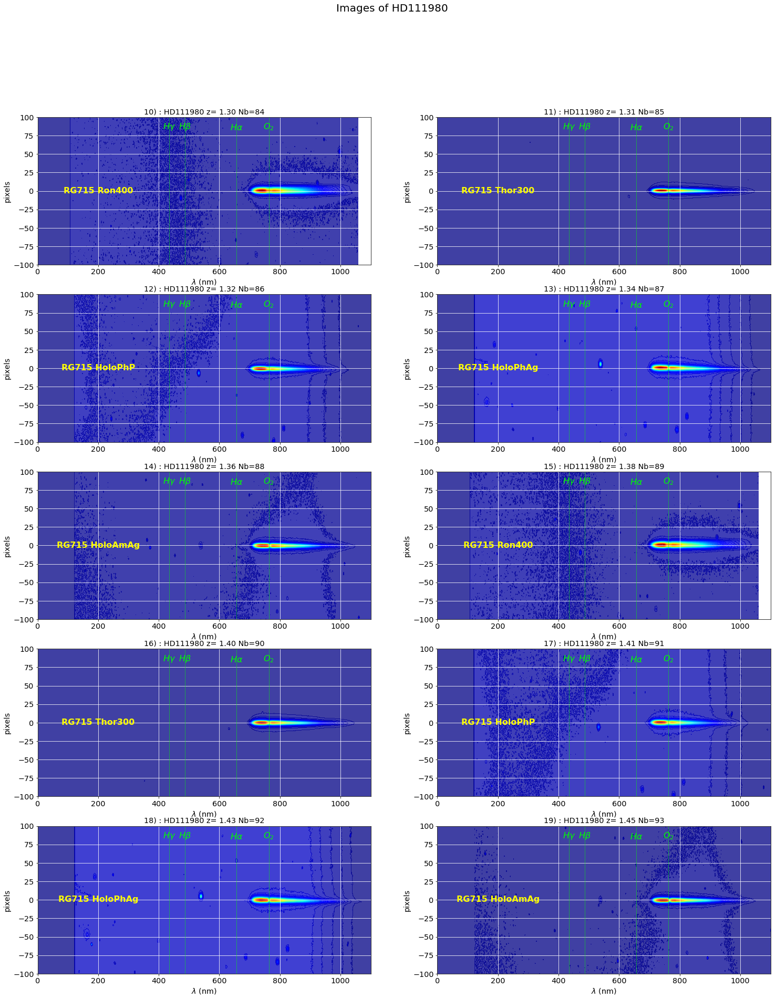

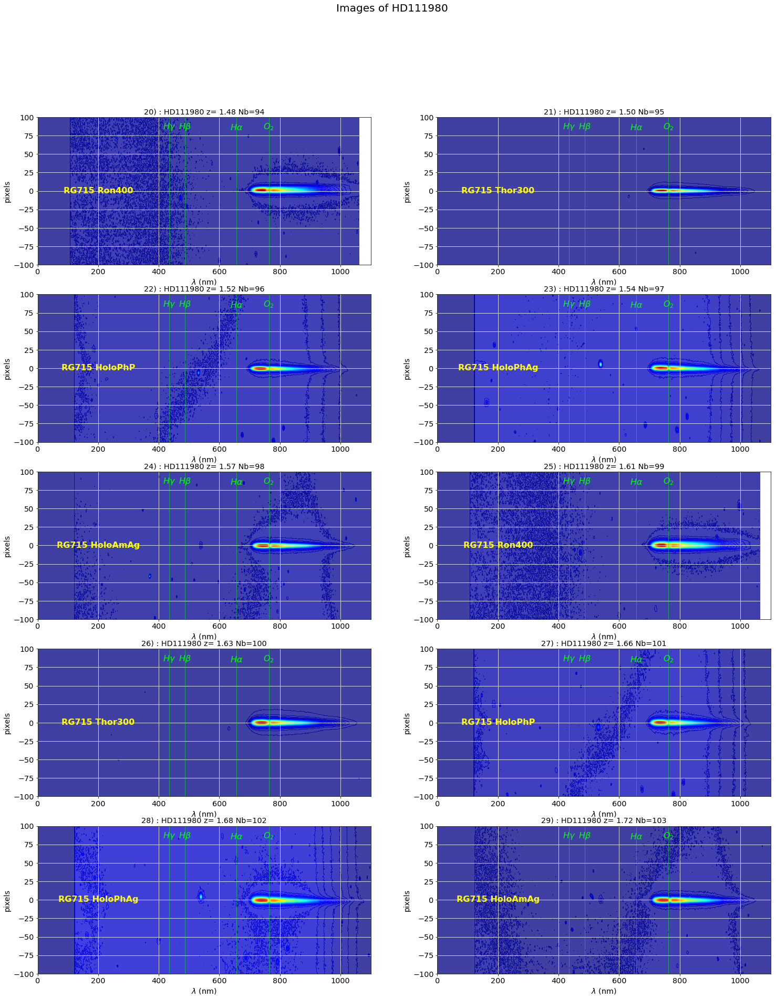

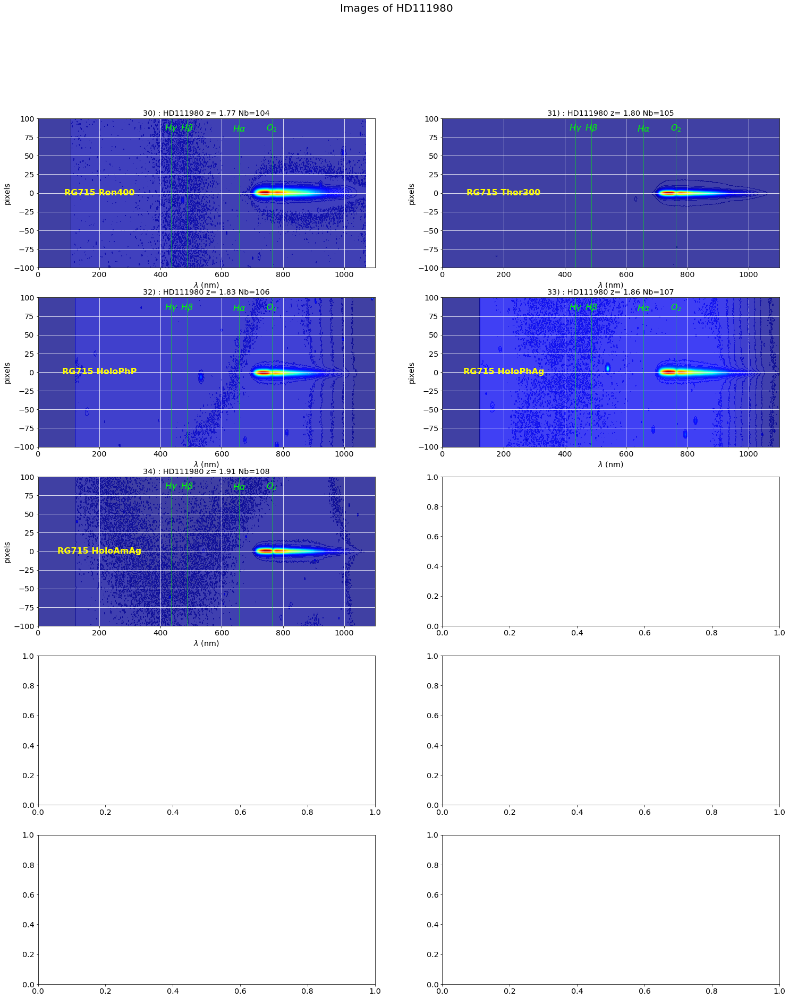

In [39]:
ShowOneOrder_contourBKG(all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'firstorderright_contour.pdf')

pdf Page written  1
pdf Page written  2
pdf Page written  3
Final pdf Page written  3


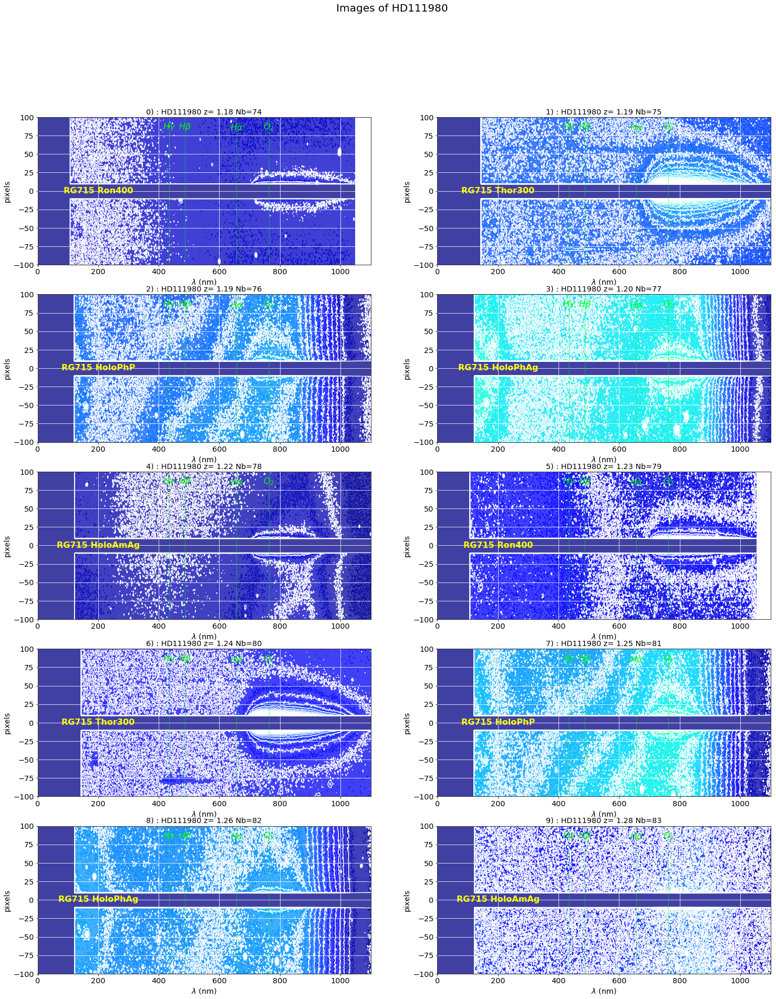

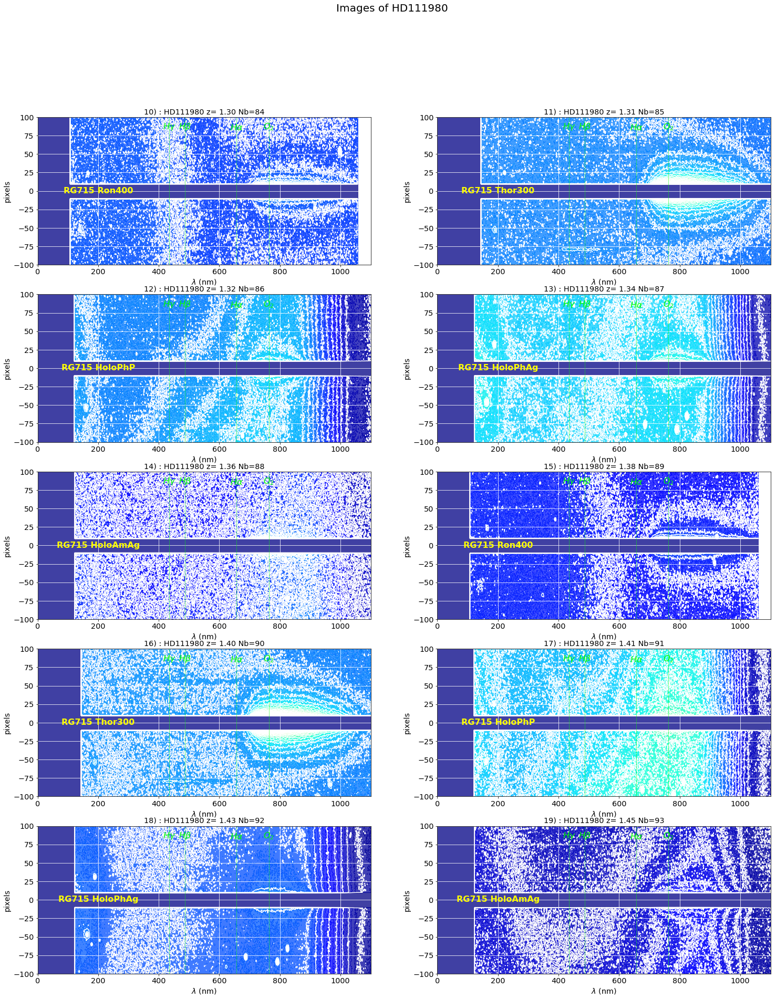

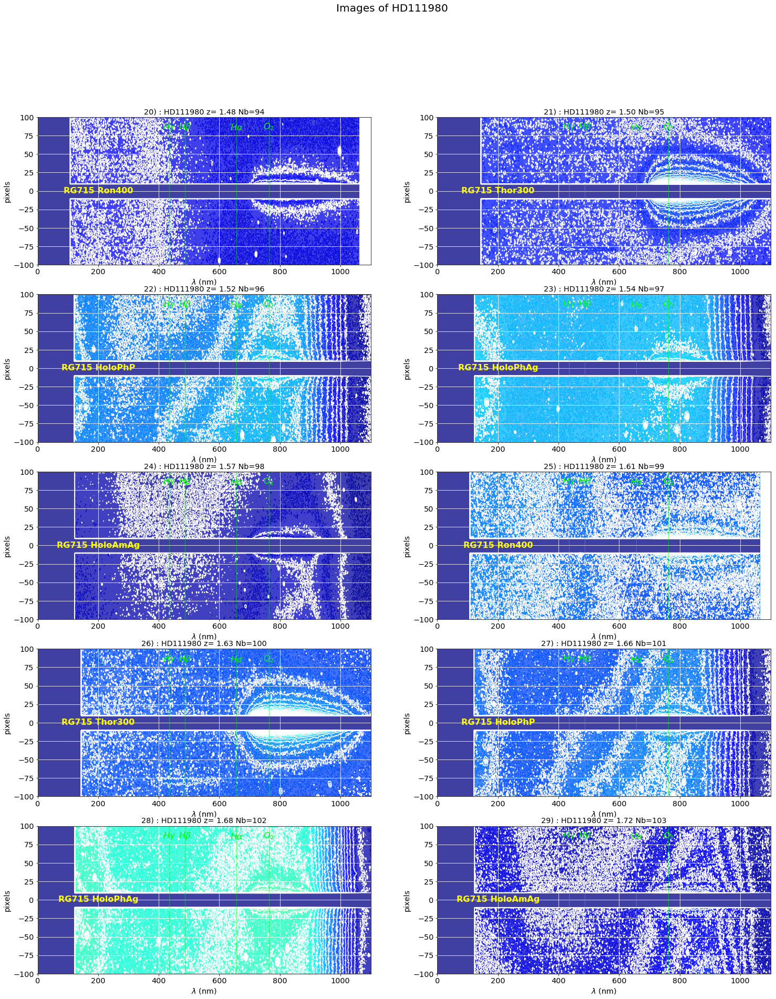

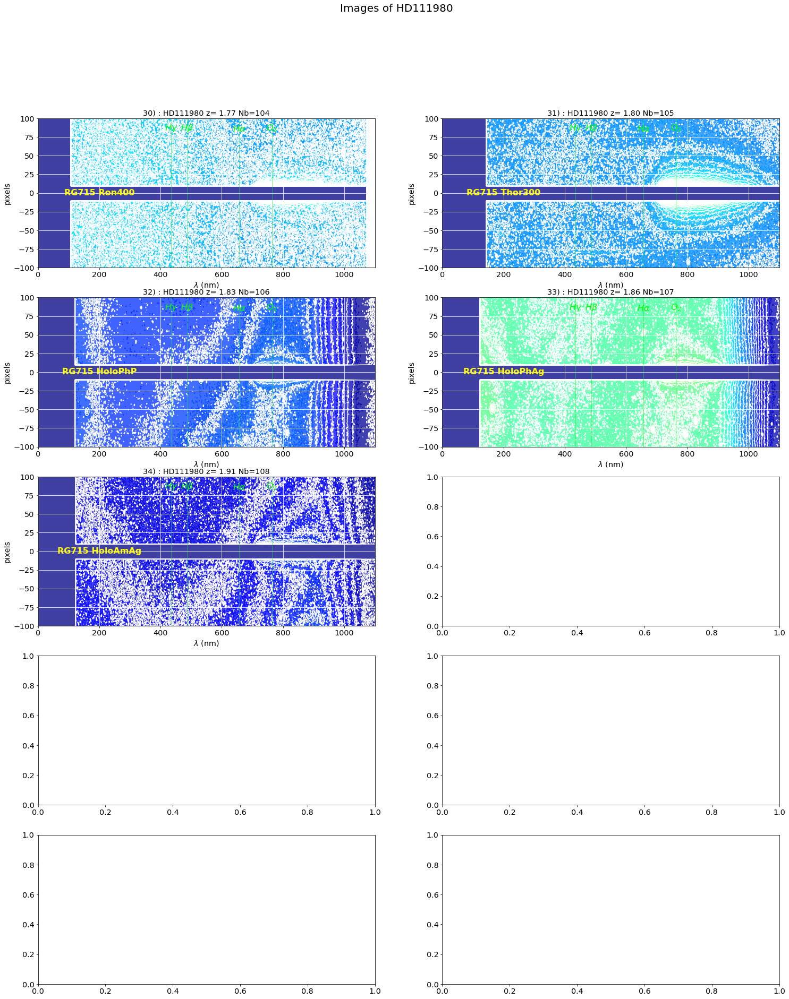

In [40]:
ShowOneOrder_contourCutBKG(all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt,'firstorderright_contour_cut.pdf')

# Study more carefully the transverse spectrum shape

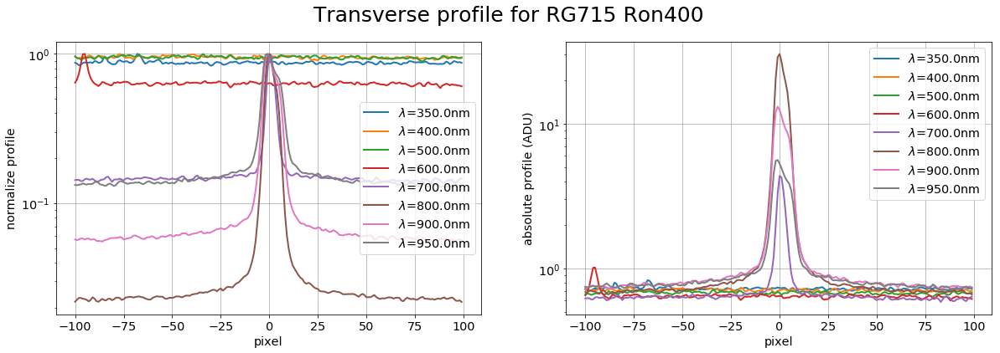

In [41]:
sel=0
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

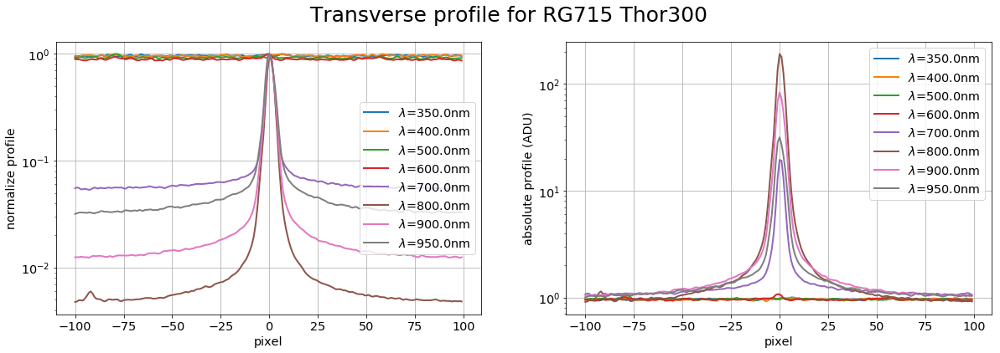

In [42]:
sel=1
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

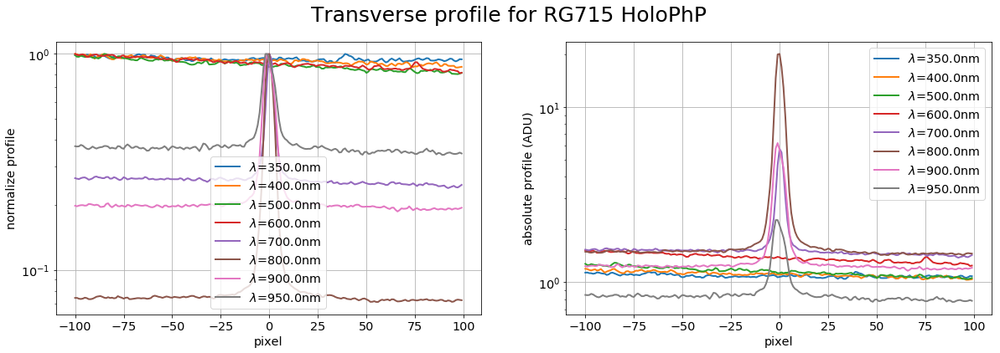

In [43]:
sel=2
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

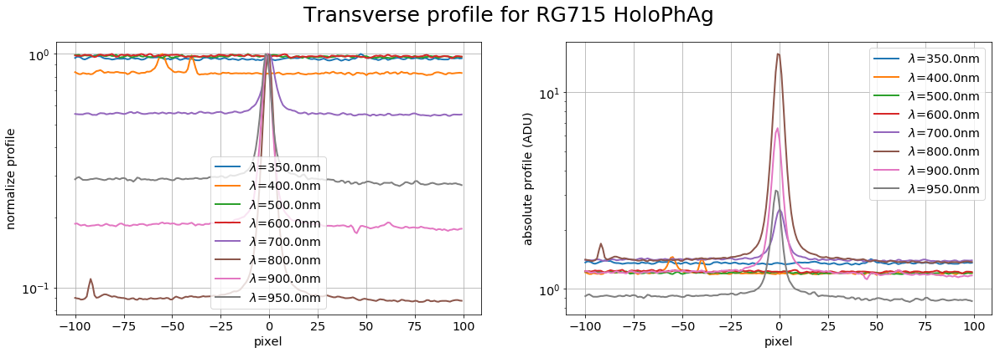

In [44]:
sel=3
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

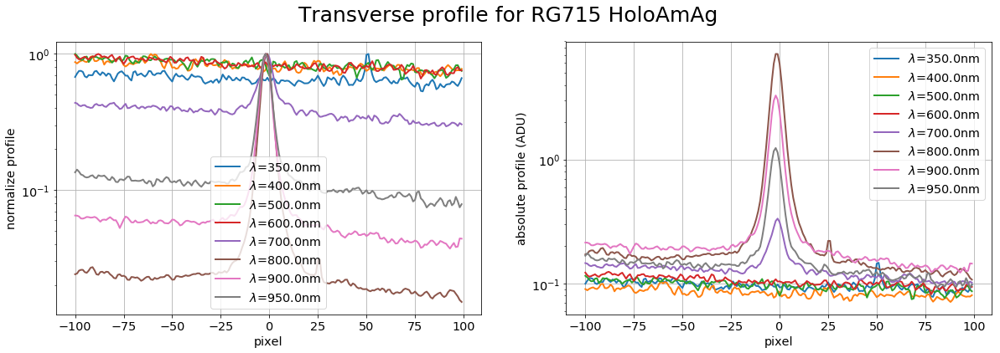

In [45]:
sel=4
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

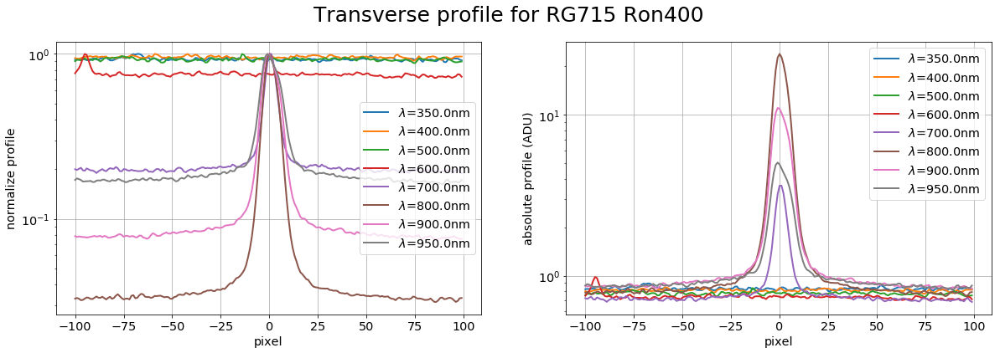

In [46]:
sel=5
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

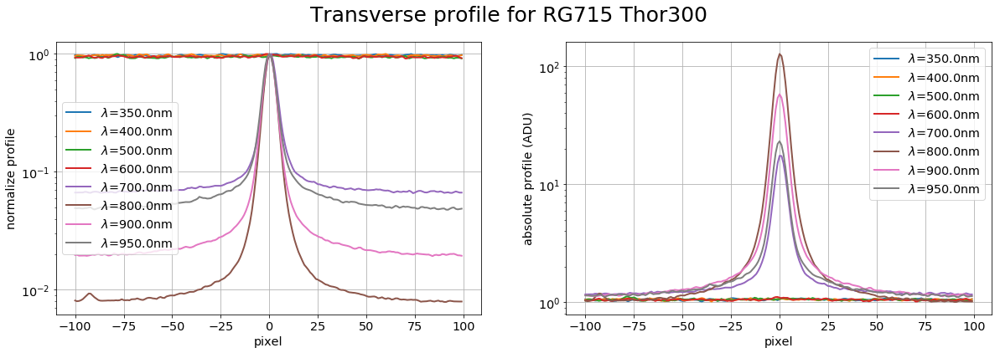

In [47]:
sel=6
ShowNarrowProfile(sel,all_images,order0_positions,x_star0,y_star0,all_titles,object_name,all_expo,dir_top_images,all_filt)

# Example of colorbar

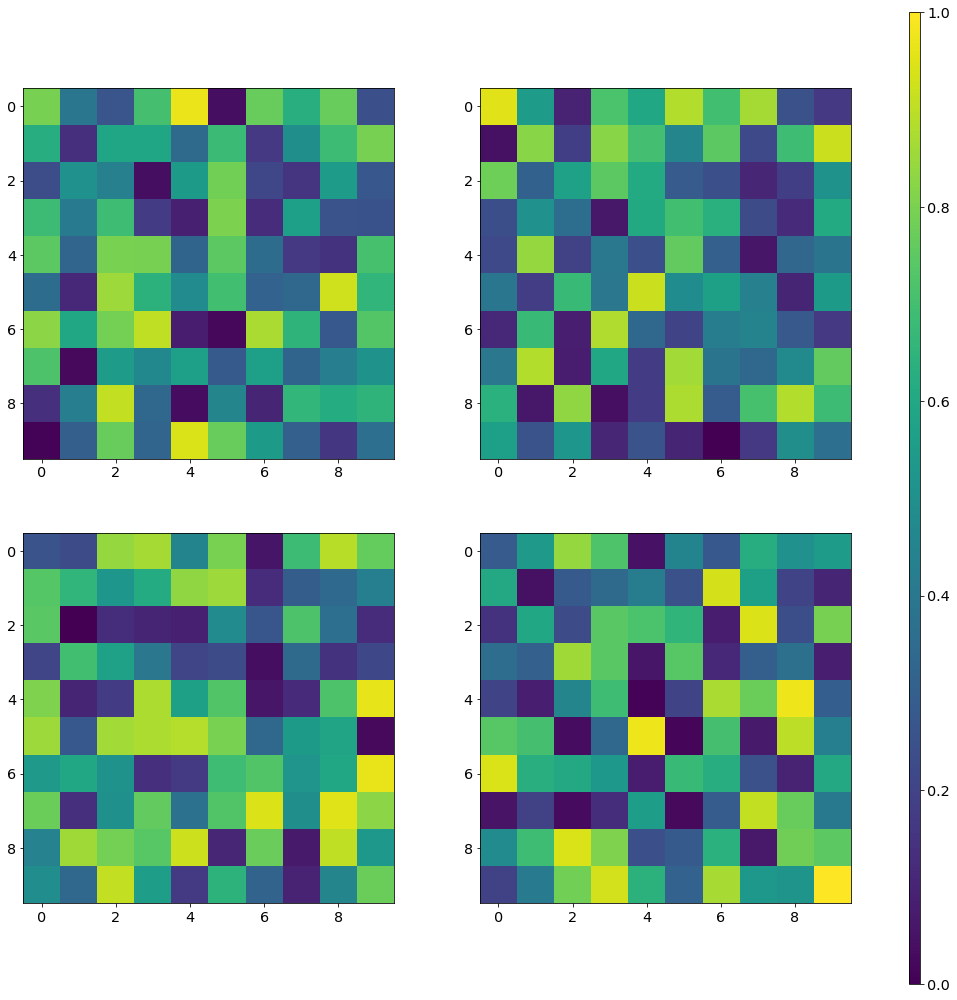

In [48]:
fig, axes = plt.subplots(nrows=2, ncols=2)
for ax in axes.flat:
    im = ax.imshow(np.random.random((10,10)), vmin=0, vmax=1)

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.95, 0.05, 0.01, 0.9])
fig.colorbar(im, cax=cbar_ax)

plt.show()